<center><h1>Erkang_Chen_Final Project</h1></center>

# Name: Erkang Chen

# ID:8906487291

# Github Username : EKC23

## Library

In [28]:
import pandas as pd
import sklearn
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
import os
import random
import math
import shutil
from PIL import Image
import numpy as np
import tensorflow as tf
from PIL import Image
import moviepy.editor as mp
from keras.models import load_model
import imageio
import cv2
from tensorflow.keras.applications import ResNet50, VGG16, EfficientNetB0
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.layers import Flatten, Dropout
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.preprocessing.image import img_to_array, load_img
from tensorflow.keras.models import load_model
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score
from tensorflow.keras.layers import Conv2D, MaxPooling2D
from tensorflow.keras.callbacks import EarlyStopping
from moviepy.editor import VideoFileClip
from keras.models import load_model
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report

### 1. Transfer Learning for Video Classification

### (a) In this problem, we are trying to build a classifier that distinguishes videos of 5 different activities

### (b) VideoClassification Videos can be viewed as a sequences of individual images; therefore, one can deal with video classification as performing image classification L times, where L is the number of frames in a video. However, this setting has a problem: it does not capture the temporal nature of the video. That is why we use RNN-CNN for video classification. Training RNN-CNN’s needs a lot of computational resources, and it might sometimes be excessive, so in this project we will take a simpler approach

### (c) Moving Averages over Predictions for Video Classification. In this approach, we train a CNN for image classification, and turn it into a video classifier using moving averages. If we rely on only one or a few frames of a video for classifying it, we will observe a phenomenon called flickering, which is assigning different labels to different frames of a video in the same class. However, if we use an average of predictions of probabilities for multiple frames, we will get a more reliable prediction for a video.

### (d) Data Exploration and Pre-processing

### i. Images in each class are given in separate folders in the folder Sport Images. We have several hundreds of images for five classes of sport activities, namely baseball, basketball, fencing, tennis, and volleyball

### ii. Randomly select [0.7 ni] images from each folder as your training set, 0.15 ni as validation set, and the rest as your test set, where ni is the number of images in folder i and [x] is the ceiling of x.

In [4]:
data_dir = "../data/Sport Images/"
classes = ["baseball", "basketball", "fencing", "tennis", "volleyball"]

train_ratio = 0.7
val_ratio = 0.15

for class_name in classes:
    class_dir = os.path.join(data_dir, class_name)
    filenames = os.listdir(class_dir)
    num_files = len(filenames)
    
    train_size = math.ceil(train_ratio * num_files)
    val_size = math.ceil(val_ratio * num_files)
    test_size = num_files - train_size - val_size
    
    random.shuffle(filenames)
    
    train_files = filenames[:train_size]
    val_files = filenames[train_size:train_size+val_size]
    test_files = filenames[train_size+val_size:]
    
    for split_name in ["train", "val", "test"]:
        split_dir = os.path.join(data_dir, split_name, class_name)
        os.makedirs(split_dir, exist_ok=True)
        
    for i, split_files in enumerate([train_files, val_files, test_files]):
        for filename in split_files:
            src_path = os.path.join(class_dir, filename)
            split_dir = os.path.join(data_dir, ["train", "val", "test"][i], class_name)
            dst_path = os.path.join(split_dir, filename)
            shutil.copy(src_path, dst_path)

### iii. In order for all the images to have the same size, zero-pad or resize the images in your dataset. This can be done using various tools, including OpenCV

In [15]:
data_dir = "../data/Sport Images/"
classes = ["baseball", "basketball", "fencing", "tennis", "volleyball"]
image_size = (224, 224)  

# Loop over each image in the train folder
train_dir = os.path.join(data_dir, "train")
for class_name in classes:
    class_dir = os.path.join(train_dir, class_name)
    
    # Loop over each image in the class
    for filename in os.listdir(class_dir):
        if filename.lower().endswith('.webp'):
            continue  # skip webp format photos
        img_path = os.path.join(class_dir, filename)
        img = Image.open(img_path)
        
        # Resize the image
        img_resized = img.resize(image_size)
        img_resized.save(img_path)

### (e) Transfer Learning for Image Classification

## For part e I do three models with step i to v.

### i. When dealing with classification of relatively small image datasets, deep networks may not perform very well because of not having enough data to train them. In such cases, one usually uses transfer learning, which uses deep learning models that are trained on very large datasets such as ImageNet as feature extractors. The idea is that such deep networks have learned to ex- tract meaningful features from an image using their layers, and those features can be used in learning other tasks. In order to do that, usually the last layer or the last few layers of the pre-trained network are removed, and the response of the layer before the removed layers to the images in the new dataset is used as a feature vector to train one more multiple replacement layers. The dataset in this task has only several hundred images per class. Given that we have 5 classes, training a deep network with such a small dataset may not yield desirable results. In this project, you will use pre-trained models ResNet50, EfficientNetB0, and VGG16. For both pre-trained networks, you will only train the last fully connected layer, and will freeze all layers before them (i.e. we do not change their parameters during training) and use the outputs of the penultimate layer in the original pre-trained model as the features extracted from each image.

### ii. To perform empirical regularization, crop, randomly zoom, rotate, flip, contrast, and translate images in your training set for image augmentation. You can use various tools to do this, including OpenCV.

### iii. Use ReLU activation functions in the last layer and a softmax layer, along with batch normalization and a dropout rate of 20% as well as ADAM optimizer. Use multinomial cross entropy loss. You can try any batch size, but a batch size of 5 seems reasonable.

### iv. Train the networks ResNet50, EfficientNetB0, and VGG16 for at least 50 epochs (preferably 100 epochs) and perform early stopping using the validation set. Keep the network parameters that have the lowest validation error. Plot the training and validation errors vs. epochs.

### v. Report the Confusion Matrix, Precision, Recall, Accuracy, and F1 score for your model on both training and test sets. Remember that this is a multi-class classificationproblem

### ResNet50 Model

In [3]:
# Define constants
img_width, img_height = 224, 224
data_dir = "../data/Sport Images/"
train_dir = os.path.join(data_dir, "train")
val_dir = os.path.join(data_dir, "val")
test_dir = os.path.join(data_dir, "test")
batch_size = 5
epochs = 50

# Load the pre-trained model
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(img_width, img_height, 3))
# Freeze the layers
for layer in base_model.layers:
    layer.trainable = False

# Create a new model on top
model = Sequential()
model.add(base_model)
model.add(Flatten())
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.2))
model.add(BatchNormalization())
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.2))
model.add(BatchNormalization())
model.add(Dense(5, activation='softmax'))

# Compile the model
model.compile(loss='categorical_crossentropy', optimizer="adam", metrics=['accuracy'])

# Define early stopping
earlystop = EarlyStopping(monitor='val_loss', patience=3)

# Data augmentation for the training set
train_datagen = ImageDataGenerator(
        rescale=1./255,
        rotation_range=45,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        vertical_flip=True,
        fill_mode='nearest')

# Data augmentation for the validation set
val_datagen = ImageDataGenerator(rescale=1./255)

# Create the data generators
train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(img_width, img_height),
        batch_size=batch_size,
        class_mode='categorical')

val_generator = val_datagen.flow_from_directory(
        val_dir,
        target_size=(img_width, img_height),
        batch_size=batch_size,
        class_mode='categorical')

# Train the model with early stopping
history = model.fit_generator(
        train_generator,
        steps_per_epoch=train_generator.samples // batch_size,
        epochs=epochs,
        validation_data=val_generator,
        validation_steps=val_generator.samples // batch_size,
        callbacks=[earlystop])

Found 2297 images belonging to 5 classes.
Found 493 images belonging to 5 classes.
Epoch 1/50
459/459 [==============================] - 317s 682ms/step - loss: 1.8886 - accuracy: 0.2522 - val_loss: 1.6155 - val_accuracy: 0.2633
Epoch 2/50
459/459 [==============================] - 308s 670ms/step - loss: 1.7300 - accuracy: 0.2561 - val_loss: 1.6832 - val_accuracy: 0.2714
Epoch 3/50
459/459 [==============================] - 310s 676ms/step - loss: 1.6633 - accuracy: 0.2408 - val_loss: 1.6203 - val_accuracy: 0.3265
Epoch 4/50
459/459 [==============================] - 312s 679ms/step - loss: 1.6067 - accuracy: 0.2609 - val_loss: 1.7163 - val_accuracy: 0.3000


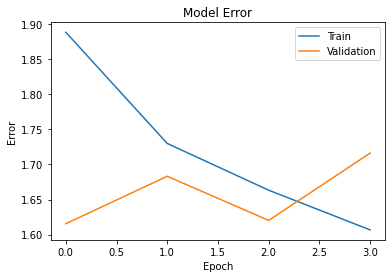

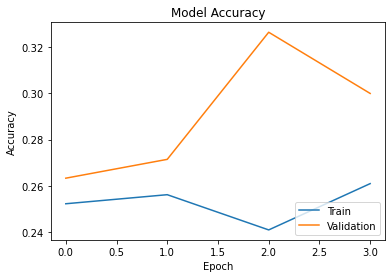

In [4]:
# Plot the training and validation losses
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Error')
plt.ylabel('Error')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()

# Plot the training and validation accuracies
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='lower right')
plt.show()

In [5]:
# Evaluate the model on the training and validation sets
train_acc = model.evaluate_generator(train_generator, steps=train_generator.samples // batch_size)
val_acc = model.evaluate_generator(val_generator, steps=val_generator.samples // batch_size)

# Print the results
print('Training Accuracy: {:.2f}%'.format(train_acc[1] * 100))
print('Validation Accuracy: {:.2f}%'.format(val_acc[1] * 100))

# Get the predictions for the test set
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(img_width, img_height),
        batch_size=batch_size,
        class_mode='categorical',
        shuffle=False)

# Calculate the confusion matrix, precision, recall, accuracy, and F1 score
#Calculate the confusion matrix
print('=======Train Sets======')
y_pred_tr = model.predict_generator(train_generator, steps=train_generator.samples // batch_size + 1)
y_true_tr = train_generator.classes


conf_mat_tr = confusion_matrix(y_true_tr, np.argmax(y_pred_tr, axis=1))
print('Confusion matrix:\n', conf_mat_tr)

#Calculate the precision for each class
precision = precision_score(y_true_tr, np.argmax(y_pred_tr, axis=1), average=None)
print('Precision:', precision)

#Calculate the recall for each class
recall = recall_score(y_true_tr, np.argmax(y_pred_tr, axis=1), average=None)
print('Recall:', recall)

#Calculate the F1 score for each class
f1 = f1_score(y_true_tr, np.argmax(y_pred_tr, axis=1), average=None)
print('F1 score:', f1)

print('=======Test Sets======')
y_pred = model.predict_generator(test_generator, steps=test_generator.samples // batch_size + 1)
y_true = test_generator.classes

conf_mat = confusion_matrix(y_true, np.argmax(y_pred, axis=1))
print('Confusion matrix:\n', conf_mat)

#Calculate the precision for each class
precision = precision_score(y_true, np.argmax(y_pred, axis=1), average=None)
print('Precision:', precision)

#Calculate the recall for each class
recall = recall_score(y_true, np.argmax(y_pred, axis=1), average=None)
print('Recall:', recall)

#Calculate the F1 score for each class
f1 = f1_score(y_true, np.argmax(y_pred, axis=1), average=None)
print('F1 score:', f1)

Training Accuracy: 27.84%
Validation Accuracy: 30.00%
Found 482 images belonging to 5 classes.
=======Train Sets======
Confusion matrix:
 [[  4  84  17 406   1]
 [  1  46  14 282   1]
 [  2  68  28 349   0]
 [  1  55  16 429   0]
 [  2  66  17 408   0]]
Precision: [0.4        0.14420063 0.30434783 0.22892209 0.        ]
Recall: [0.0078125  0.13372093 0.06263982 0.85628743 0.        ]
F1 score: [0.01532567 0.1387632  0.1038961  0.36126316 0.        ]
=======Test Sets======
Confusion matrix:
 [[ 0 14  6 88  0]
 [ 0 42 15 16  0]
 [ 0 18 19 53  1]
 [ 0 10 11 84  0]
 [ 2 41  7 55  0]]
Precision: [0.         0.336      0.32758621 0.28378378 0.        ]
Recall: [0.         0.57534247 0.20879121 0.8        0.        ]
F1 score: [0.         0.42424242 0.25503356 0.41895262 0.        ]


### EfficientNetB0 model

In [16]:
# Define constants
img_width, img_height = 224, 224
data_dir = "../data/Sport Images/"
train_dir = os.path.join(data_dir, "train")
val_dir = os.path.join(data_dir, "val")
test_dir = os.path.join(data_dir, "test")
batch_size = 5
epochs = 50

# Load the pre-trained model
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(img_width, img_height, 3))

# Freeze the layers
for layer in base_model.layers:
    layer.trainable = False

# Create a new model on top
model = Sequential()
model.add(base_model)
model.add(Flatten())
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.2))
model.add(BatchNormalization())
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.2))
model.add(BatchNormalization())
model.add(Dense(5, activation='softmax'))

# Compile the model
model.compile(loss='categorical_crossentropy', optimizer="adam", metrics=['accuracy'])

# Data augmentation for the training set
train_datagen = ImageDataGenerator(
        rescale=1./255,
        rotation_range=45,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        vertical_flip=True,
        fill_mode='nearest')

# Data augmentation for the validation set
val_datagen = ImageDataGenerator(rescale=1./255)

# Create the data generators
train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(img_width, img_height),
        batch_size=batch_size,
        class_mode='categorical')

val_generator = val_datagen.flow_from_directory(
        val_dir,
        target_size=(img_width, img_height),
        batch_size=batch_size,
        class_mode='categorical')

# Train the model
history = model.fit_generator(
        train_generator,
        steps_per_epoch=train_generator.samples // batch_size,
        epochs=epochs,
        validation_data=val_generator,
        validation_steps=val_generator.samples // batch_size)



16705208/16705208 [==============================] - 1s 0us/step
Found 2297 images belonging to 5 classes.
Found 493 images belonging to 5 classes.
Epoch 1/50
459/459 [==============================] - 172s 361ms/step - loss: 1.9704 - accuracy: 0.1859 - val_loss: 1.6421 - val_accuracy: 0.2143
Epoch 2/50
459/459 [==============================] - 160s 349ms/step - loss: 1.7917 - accuracy: 0.2042 - val_loss: 1.6919 - val_accuracy: 0.1959
Epoch 3/50
459/459 [==============================] - 160s 349ms/step - loss: 1.7201 - accuracy: 0.2107 - val_loss: 1.6161 - val_accuracy: 0.2265
Epoch 4/50
459/459 [==============================] - 165s 359ms/step - loss: 1.6850 - accuracy: 0.2090 - val_loss: 1.5986 - val_accuracy: 0.1939
Epoch 5/50
459/459 [==============================] - 162s 352ms/step - loss: 1.6482 - accuracy: 0.2086 - val_loss: 1.6044 - val_accuracy: 0.2122
Epoch 6/50
459/459 [==============================] - 162s 352ms/step - loss: 1.6355 - accuracy: 0.2077 - val_loss: 1.6037

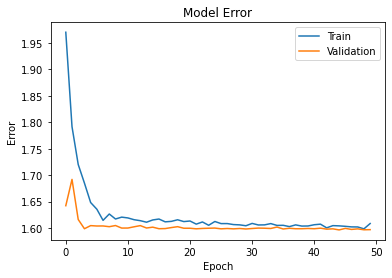

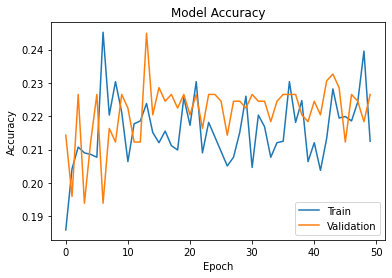

In [17]:
# Plot the training and validation losses
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Error')
plt.ylabel('Error')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()

# Plot the training and validation accuracies
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='lower right')
plt.show()


In [18]:
# Evaluate the model on the training and validation sets
train_acc = model.evaluate_generator(train_generator, steps=train_generator.samples // batch_size)
val_acc = model.evaluate_generator(val_generator, steps=val_generator.samples // batch_size)

# Print the results
print('Training Accuracy: {:.2f}%'.format(train_acc[1] * 100))
print('Validation Accuracy: {:.2f}%'.format(val_acc[1] * 100))

# Get the predictions for the test set
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(img_width, img_height),
        batch_size=batch_size,
        class_mode='categorical',
        shuffle=False)

# Calculate the confusion matrix, precision, recall, accuracy, and F1 score
#Calculate the confusion matrix
print('=======Train Sets======')
y_pred_tr = model.predict_generator(train_generator, steps=train_generator.samples // batch_size + 1)
y_true_tr = train_generator.classes


conf_mat_tr = confusion_matrix(y_true_tr, np.argmax(y_pred_tr, axis=1))
print('Confusion matrix:\n', conf_mat_tr)

#Calculate the precision for each class
precision = precision_score(y_true_tr, np.argmax(y_pred_tr, axis=1), average=None)
print('Precision:', precision)

#Calculate the recall for each class
recall = recall_score(y_true_tr, np.argmax(y_pred_tr, axis=1), average=None)
print('Recall:', recall)

#Calculate the F1 score for each class
f1 = f1_score(y_true_tr, np.argmax(y_pred_tr, axis=1), average=None)
print('F1 score:', f1)

print('=======Test Sets======')
y_pred = model.predict_generator(test_generator, steps=test_generator.samples // batch_size + 1)
y_true = test_generator.classes

conf_mat = confusion_matrix(y_true, np.argmax(y_pred, axis=1))
print('Confusion matrix:\n', conf_mat)

#Calculate the precision for each class
precision = precision_score(y_true, np.argmax(y_pred, axis=1), average=None)
print('Precision:', precision)

#Calculate the recall for each class
recall = recall_score(y_true, np.argmax(y_pred, axis=1), average=None)
print('Recall:', recall)

#Calculate the F1 score for each class
f1 = f1_score(y_true, np.argmax(y_pred, axis=1), average=None)
print('F1 score:', f1)

Training Accuracy: 22.22%
Validation Accuracy: 22.65%
Found 482 images belonging to 5 classes.
=======Train Sets======
Confusion matrix:
 [[512   0   0   0   0]
 [344   0   0   0   0]
 [447   0   0   0   0]
 [501   0   0   0   0]
 [493   0   0   0   0]]
Precision: [0.22289943 0.         0.         0.         0.        ]
Recall: [1. 0. 0. 0. 0.]
F1 score: [0.36454254 0.         0.         0.         0.        ]
=======Test Sets======
Confusion matrix:
 [[108   0   0   0   0]
 [ 73   0   0   0   0]
 [ 91   0   0   0   0]
 [105   0   0   0   0]
 [105   0   0   0   0]]
Precision: [0.22406639 0.         0.         0.         0.        ]
Recall: [1. 0. 0. 0. 0.]
F1 score: [0.36610169 0.         0.         0.         0.        ]


### VGG16 Model

In [19]:
# Define constants
img_width, img_height = 224, 224
data_dir = "../data/Sport Images/"
train_dir = os.path.join(data_dir, "train")
val_dir = os.path.join(data_dir, "val")
test_dir = os.path.join(data_dir, "test")
batch_size = 5
epochs = 50

# Load the pre-trained model
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(img_width, img_height, 3))

# Freeze the layers
for layer in base_model.layers:
    layer.trainable = False

# Create a new model on top
model = Sequential()
model.add(base_model)
model.add(Flatten())
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.2))
model.add(BatchNormalization())
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.2))
model.add(BatchNormalization())
model.add(Dense(5, activation='softmax'))

# Compile the model
model.compile(loss='categorical_crossentropy', optimizer="adam", metrics=['accuracy'])

# Data augmentation for the training set
train_datagen = ImageDataGenerator(
        rescale=1./255,
        rotation_range=45,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        vertical_flip=True,
        fill_mode='nearest')

# Data augmentation for the validation set
val_datagen = ImageDataGenerator(rescale=1./255)

# Create the data generators
train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(img_width, img_height),
        batch_size=batch_size,
        class_mode='categorical')

val_generator = val_datagen.flow_from_directory(
        val_dir,
        target_size=(img_width, img_height),
        batch_size=batch_size,
        class_mode='categorical')

# Train the model
history = model.fit_generator(
        train_generator,
        steps_per_epoch=train_generator.samples // batch_size,
        epochs=epochs,
        validation_data=val_generator,
        validation_steps=val_generator.samples // batch_size)

58889256/58889256 [==============================] - 5s 0us/step
Found 2297 images belonging to 5 classes.
Found 493 images belonging to 5 classes.
Epoch 1/50
459/459 [==============================] - 450s 977ms/step - loss: 1.6716 - accuracy: 0.3578 - val_loss: 1.1911 - val_accuracy: 0.5429
Epoch 2/50
459/459 [==============================] - 439s 957ms/step - loss: 1.4352 - accuracy: 0.4359 - val_loss: 1.0591 - val_accuracy: 0.5939
Epoch 3/50
459/459 [==============================] - 439s 957ms/step - loss: 1.3971 - accuracy: 0.4402 - val_loss: 1.2397 - val_accuracy: 0.5429
Epoch 4/50
459/459 [==============================] - 439s 957ms/step - loss: 1.3373 - accuracy: 0.4524 - val_loss: 1.1464 - val_accuracy: 0.5694
Epoch 5/50
459/459 [==============================] - 441s 960ms/step - loss: 1.3186 - accuracy: 0.4559 - val_loss: 1.2785 - val_accuracy: 0.4490
Epoch 6/50
459/459 [==============================] - 442s 962ms/step - loss: 1.3170 - accuracy: 0.4642 - val_loss: 1.1264

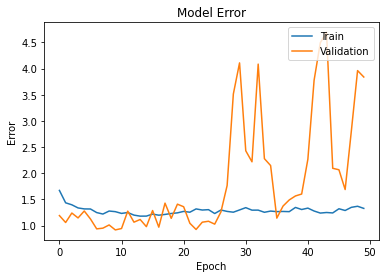

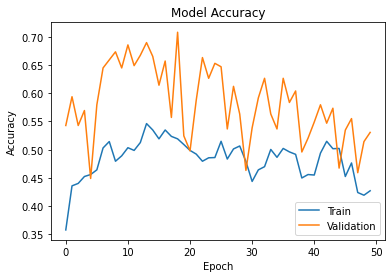

In [20]:
# Plot the training and validation losses
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Error')
plt.ylabel('Error')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()

# Plot the training and validation accuracies
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='lower right')
plt.show()

In [21]:
# Evaluate the model on the training and validation sets
train_acc = model.evaluate_generator(train_generator, steps=train_generator.samples // batch_size)
val_acc = model.evaluate_generator(val_generator, steps=val_generator.samples // batch_size)

# Print the results
print('Training Accuracy: {:.2f}%'.format(train_acc[1] * 100))
print('Validation Accuracy: {:.2f}%'.format(val_acc[1] * 100))

# Get the predictions for the test set
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(img_width, img_height),
        batch_size=batch_size,
        class_mode='categorical',
        shuffle=False)

# Calculate the confusion matrix, precision, recall, accuracy, and F1 score
#Calculate the confusion matrix
print('=======Train Sets======')
y_pred_tr = model.predict_generator(train_generator, steps=train_generator.samples // batch_size + 1)
y_true_tr = train_generator.classes


conf_mat_tr = confusion_matrix(y_true_tr, np.argmax(y_pred_tr, axis=1))
print('Confusion matrix:\n', conf_mat_tr)

#Calculate the precision for each class
precision = precision_score(y_true_tr, np.argmax(y_pred_tr, axis=1), average=None)
print('Precision:', precision)

#Calculate the recall for each class
recall = recall_score(y_true_tr, np.argmax(y_pred_tr, axis=1), average=None)
print('Recall:', recall)

#Calculate the F1 score for each class
f1 = f1_score(y_true_tr, np.argmax(y_pred_tr, axis=1), average=None)
print('F1 score:', f1)

print('=======Test Sets======')
y_pred = model.predict_generator(test_generator, steps=test_generator.samples // batch_size + 1)
y_true = test_generator.classes

conf_mat = confusion_matrix(y_true, np.argmax(y_pred, axis=1))
print('Confusion matrix:\n', conf_mat)

#Calculate the precision for each class
precision = precision_score(y_true, np.argmax(y_pred, axis=1), average=None)
print('Precision:', precision)

#Calculate the recall for each class
recall = recall_score(y_true, np.argmax(y_pred, axis=1), average=None)
print('Recall:', recall)

#Calculate the F1 score for each class
f1 = f1_score(y_true, np.argmax(y_pred, axis=1), average=None)
print('F1 score:', f1)

Training Accuracy: 52.55%
Validation Accuracy: 52.86%
Found 482 images belonging to 5 classes.
=======Train Sets======
Confusion matrix:
 [[211 112  20  58 111]
 [114  85  15  38  92]
 [160 120  20  55  92]
 [181 131  17  63 109]
 [197 104  19  51 122]]
Precision: [0.24449594 0.15398551 0.21978022 0.23773585 0.23193916]
Recall: [0.41210938 0.24709302 0.04474273 0.1257485  0.2474645 ]
F1 score: [0.30690909 0.18973214 0.07434944 0.16449086 0.23945044]
=======Test Sets======
Confusion matrix:
 [[59 14  3 17 15]
 [ 3 51  5  4 10]
 [ 4 36 21  7 23]
 [27  3  2 65  8]
 [ 5 13  9  4 74]]
Precision: [0.60204082 0.43589744 0.525      0.67010309 0.56923077]
Recall: [0.5462963  0.69863014 0.23076923 0.61904762 0.7047619 ]
F1 score: [0.57281553 0.53684211 0.32061069 0.64356436 0.62978723]


### (f) Video Classification Using Moving Averages

### i. In order to have a better deep learner, reuse the validation and test data and train the network, without seriously overfitting it. In the lectures, we saw how this can be done.

In [22]:
data_dir = "../data/Sport Videos/"
classes = ["BaseballPitch", "Basketball", "Fencing", "TennisSwing", "VolleyballSpiking"]

train_ratio = 0.7
val_ratio = 0.15

for class_name in classes:
    class_dir = os.path.join(data_dir, class_name)
    filenames = os.listdir(class_dir)
    num_files = len(filenames)
    
    train_size = math.ceil(train_ratio * num_files)
    val_size = math.ceil(val_ratio * num_files)
    test_size = num_files - train_size - val_size
    
    random.shuffle(filenames)
    
    train_files = filenames[:train_size]
    val_files = filenames[train_size:train_size+val_size]
    test_files = filenames[train_size+val_size:]
    
    for split_name in ["train", "val", "test"]:
        split_dir = os.path.join(data_dir, split_name, class_name)
        os.makedirs(split_dir, exist_ok=True)
        
        # Modify to reuse the validation and test data for training
        if split_name == "train":
            split_files = train_files + val_files + test_files
        else:
            split_files = []
            for filename in val_files + test_files:
                src_path = os.path.join(class_dir, filename)
                dst_path = os.path.join(split_dir, filename)
                shutil.copy(src_path, dst_path)
                split_files.append(filename)
        
        for filename in split_files:
            src_path = os.path.join(class_dir, filename)
            dst_path = os.path.join(split_dir, filename)
            shutil.copy(src_path, dst_path)

In [2]:
img_width, img_height = 224, 224
data_dir = "../data/Sport Images/"
train_dir = os.path.join(data_dir, "train")
val_dir = os.path.join(data_dir, "val")
test_dir = os.path.join(data_dir, "test")
batch_size = 5
epochs = 50

# Load the pre-trained model
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(img_width, img_height, 3))
# Freeze the layers
for layer in base_model.layers:
    layer.trainable = False

# Create a new model on top
model = Sequential()
model.add(base_model)
model.add(Flatten())
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.2))
model.add(BatchNormalization())
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.2))
model.add(BatchNormalization())
model.add(Dense(5, activation='softmax'))

# Compile the model
model.compile(loss='categorical_crossentropy', optimizer="adam", metrics=['accuracy'])

# Define early stopping
earlystop = EarlyStopping(monitor='val_loss', patience=3)

# Data augmentation for the training set
train_datagen = ImageDataGenerator(
        rescale=1./255,
        rotation_range=45,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        vertical_flip=True,
        fill_mode='nearest')

# Data augmentation for the validation set
val_datagen = ImageDataGenerator(rescale=1./255)

# Create the data generators for training and validation
train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(img_width, img_height),
        batch_size=batch_size,
        class_mode='categorical')

val_generator = val_datagen.flow_from_directory(
        val_dir,
        target_size=(img_width, img_height),
        batch_size=batch_size,
        class_mode='categorical')

# Fit the model with early stopping and validation data
history = model.fit(
        train_generator,
        steps_per_epoch=train_generator.samples // batch_size,
        epochs=epochs,
        validation_data=val_generator,
        validation_steps=val_generator.samples // batch_size,
        callbacks=[earlystop])

Found 2297 images belonging to 5 classes.
Found 493 images belonging to 5 classes.
Epoch 1/50
459/459 [==============================] - 328s 706ms/step - loss: 1.8866 - accuracy: 0.2400 - val_loss: 1.5848 - val_accuracy: 0.3204
Epoch 2/50
459/459 [==============================] - 325s 709ms/step - loss: 1.6832 - accuracy: 0.2727 - val_loss: 2.0808 - val_accuracy: 0.2714
Epoch 3/50
459/459 [==============================] - 328s 714ms/step - loss: 1.6236 - accuracy: 0.2919 - val_loss: 1.5763 - val_accuracy: 0.3245
Epoch 4/50
459/459 [==============================] - 323s 703ms/step - loss: 1.5986 - accuracy: 0.2583 - val_loss: 1.6200 - val_accuracy: 0.3184
Epoch 5/50
459/459 [==============================] - 326s 709ms/step - loss: 1.5728 - accuracy: 0.2871 - val_loss: 1.7225 - val_accuracy: 0.2612
Epoch 6/50
459/459 [==============================] - 337s 734ms/step - loss: 1.5538 - accuracy: 0.2941 - val_loss: 2.8976 - val_accuracy: 0.2000


In [19]:
model.save('Res_f_model.h5')

### ii. Apply at least L equally spaced frames of each video in the folder Sport Videos to your model to obtain L vectors of probability predictions from the softmax in your model. You must choose L to be at least 100, but you are welcome to use all the frames in each video. Calculate the average p̄ of these probability vectors for each video.

In [26]:
data_dir = "../data/Sport Videos/"
classes = ["BaseballPitch", "Basketball", "Fencing", "TennisSwing", "VolleyballSpiking"]
L = 100
batch_size = 5

# Set up your model architecture
model = Sequential()
model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(img_width, img_height, 3)))
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Flatten())
model.add(Dense(64, activation='relu'))
model.add(Dense(5, activation='softmax'))

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model with early stopping
early_stop = EarlyStopping(monitor='val_loss', patience=10)
history = model.fit(train_generator, steps_per_epoch=train_generator.samples // batch_size, epochs=50,
        validation_data=val_generator, validation_steps=val_generator.samples // batch_size, callbacks=[early_stop])

# Evaluate the model on the test set
test_loss, test_acc = model.evaluate(test_generator, steps=test_generator.samples // batch_size)
print('Test accuracy:', test_acc)

Epoch 1/50
459/459 [==============================] - 87s 187ms/step - loss: 1.6556 - accuracy: 0.3408 - val_loss: 1.5845 - val_accuracy: 0.3327
Epoch 2/50
459/459 [==============================] - 87s 189ms/step - loss: 1.4214 - accuracy: 0.4062 - val_loss: 1.3512 - val_accuracy: 0.4490
Epoch 3/50
459/459 [==============================] - 87s 189ms/step - loss: 1.2980 - accuracy: 0.4690 - val_loss: 1.3194 - val_accuracy: 0.5020
Epoch 4/50
459/459 [==============================] - 86s 187ms/step - loss: 1.2257 - accuracy: 0.5031 - val_loss: 1.1864 - val_accuracy: 0.5592
Epoch 5/50
459/459 [==============================] - 86s 187ms/step - loss: 1.1541 - accuracy: 0.5563 - val_loss: 1.1486 - val_accuracy: 0.5796
Epoch 6/50
459/459 [==============================] - 86s 187ms/step - loss: 1.0878 - accuracy: 0.5916 - val_loss: 1.3738 - val_accuracy: 0.5612
Epoch 7/50
459/459 [==============================] - 86s 187ms/step - loss: 1.0533 - accuracy: 0.5903 - val_loss: 1.2168 - val_ac

In [42]:
probabilities = {}

for class_name in classes:
    class_dir = os.path.join(data_dir, class_name)
    filenames = os.listdir(class_dir)

    for filename in filenames:
        video_path = os.path.join(class_dir, filename)
        video_probabilities = []

        reader = imageio.get_reader(video_path)
        fps = reader.get_meta_data()['fps']

        for frame in reader:
            frame = Image.fromarray(frame)
            frame = frame.resize((224, 224))
            frame = np.array(frame)
            x = np.expand_dims(frame, axis=0)
            x = preprocess_input(x)
            preds = model.predict(x)
            video_probabilities.append(preds)

        reader.close()

        if len(video_probabilities) > 0:
            avg_probs = np.mean(np.array(video_probabilities), axis=0)
            probabilities[filename] = avg_probs

print(probabilities)

1/1 [==============================] - 0s 37ms/step
{'v_BaseballPitch_g10_c05.avi': array([[0., 0., 1., 0., 0.]], dtype=float32), 'v_BaseballPitch_g08_c03.avi': array([[0., 0., 1., 0., 0.]], dtype=float32), 'v_BaseballPitch_g18_c03.avi': array([[0., 0., 1., 0., 0.]], dtype=float32), 'v_BaseballPitch_g09_c06.avi': array([[0., 0., 1., 0., 0.]], dtype=float32), 'v_BaseballPitch_g09_c07.avi': array([[0., 0., 1., 0., 0.]], dtype=float32), 'v_BaseballPitch_g18_c02.avi': array([[0., 0., 1., 0., 0.]], dtype=float32), 'v_BaseballPitch_g08_c02.avi': array([[0., 0., 1., 0., 0.]], dtype=float32), 'v_BaseballPitch_g10_c04.avi': array([[0.0000000e+00, 3.7903885e-30, 9.8305082e-01, 0.0000000e+00,
        1.6949153e-02]], dtype=float32), 'v_BaseballPitch_g11_c01.avi': array([[0., 0., 1., 0., 0.]], dtype=float32), 'v_BaseballPitch_g01_c01.avi': array([[0., 0., 1., 0., 0.]], dtype=float32), 'v_BaseballPitch_g11_c03.avi': array([[0., 0., 1., 0., 0.]], dtype=float32), 'v_BaseballPitch_g01_c03.avi': array(

In [43]:
print(avg_probs)

[[0. 0. 1. 0. 0.]]


In [3]:
data_dir = "../data/Sport Videos/"
classes = ["BaseballPitch", "Basketball", "Fencing", "TennisSwing", "VolleyballSpiking"]
L = 100

# Load the pre-trained model
model = load_model('Res_f_model.h5')

probabilities = {}

for class_name in classes:
    class_dir = os.path.join(data_dir, class_name)
    filenames = os.listdir(class_dir)

    for filename in filenames:
        video_path = os.path.join(class_dir, filename)
        video_probabilities = []

        reader = imageio.get_reader(video_path)
        fps = reader.get_meta_data()['fps']

        for frame in reader:
            frame = Image.fromarray(frame)
            frame = frame.resize((224, 224))
            frame = np.array(frame)
            x = np.expand_dims(frame, axis=0)
            x = preprocess_input(x)
            preds = model.predict(x)
            video_probabilities.append(preds)

        reader.close()

        if len(video_probabilities) > 0:
            avg_probs = np.mean(np.array(video_probabilities), axis=0)
            probabilities[filename] = avg_probs

print(probabilities)

1/1 [==============================] - 0s 136ms/step
{'v_BaseballPitch_g10_c05.avi': array([[0., 1., 0., 0., 0.]], dtype=float32), 'v_BaseballPitch_g08_c03.avi': array([[0., 1., 0., 0., 0.]], dtype=float32), 'v_BaseballPitch_g18_c03.avi': array([[0., 1., 0., 0., 0.]], dtype=float32), 'v_BaseballPitch_g09_c06.avi': array([[0., 1., 0., 0., 0.]], dtype=float32), 'v_BaseballPitch_g09_c07.avi': array([[0., 1., 0., 0., 0.]], dtype=float32), 'v_BaseballPitch_g18_c02.avi': array([[0., 1., 0., 0., 0.]], dtype=float32), 'v_BaseballPitch_g08_c02.avi': array([[0., 1., 0., 0., 0.]], dtype=float32), 'v_BaseballPitch_g10_c04.avi': array([[0., 1., 0., 0., 0.]], dtype=float32), 'v_BaseballPitch_g11_c01.avi': array([[0., 1., 0., 0., 0.]], dtype=float32), 'v_BaseballPitch_g01_c01.avi': array([[0., 1., 0., 0., 0.]], dtype=float32), 'v_BaseballPitch_g11_c03.avi': array([[0., 1., 0., 0., 0.]], dtype=float32), 'v_BaseballPitch_g01_c03.avi': array([[0., 1., 0., 0., 0.]], dtype=float32), 'v_BaseballPitch_g09_c

In [4]:
print(avg_probs)

[[0. 1. 0. 0. 0.]]


### iii. Select the class with maximum probability in the vector p for each video and compare it to the actual label of the video

In [5]:
data_dir = "../data/Sport Videos/"
classes = ["BaseballPitch", "Basketball", "Fencing", "TennisSwing", "VolleyballSpiking"]
L = 100

# Load the pre-trained model
model = load_model('Res_f_model.h5')

# Initialize variables for accuracy calculation
correct_preds = 0
total_preds = 0

for class_name in classes:
    class_dir = os.path.join(data_dir, class_name)
    filenames = os.listdir(class_dir)

    for filename in filenames:
        video_path = os.path.join(class_dir, filename)
        video_probabilities = []

        reader = imageio.get_reader(video_path)
        fps = reader.get_meta_data()['fps']

        for frame in reader:
            frame = Image.fromarray(frame)
            frame = frame.resize((224, 224))
            frame = np.array(frame)
            x = np.expand_dims(frame, axis=0)
            x = preprocess_input(x)
            preds = model.predict(x)
            video_probabilities.append(preds)

        reader.close()

        if len(video_probabilities) > 0:
            avg_probs = np.mean(np.array(video_probabilities), axis=0)
            predicted_class = classes[np.argmax(avg_probs)]
            actual_class = class_name

            if predicted_class == actual_class:
                correct_preds += 1

            total_preds += 1

            print(f"{filename}: Predicted class - {predicted_class}, Actual class - {actual_class}")

# Calculate accuracy
accuracy = correct_preds / total_preds
print(f"Accuracy: {accuracy}")


1/1 [==============================] - 0s 105ms/step
v_BaseballPitch_g10_c05.avi: Predicted class - Basketball, Actual class - BaseballPitch
1/1 [==============================] - 0s 104ms/step
v_BaseballPitch_g08_c03.avi: Predicted class - Basketball, Actual class - BaseballPitch
1/1 [==============================] - 0s 106ms/step
v_BaseballPitch_g18_c03.avi: Predicted class - Basketball, Actual class - BaseballPitch
1/1 [==============================] - 0s 115ms/step
v_BaseballPitch_g09_c06.avi: Predicted class - Basketball, Actual class - BaseballPitch
1/1 [==============================] - 0s 108ms/step
v_BaseballPitch_g09_c07.avi: Predicted class - Basketball, Actual class - BaseballPitch
1/1 [==============================] - 0s 106ms/step
v_BaseballPitch_g18_c02.avi: Predicted class - Basketball, Actual class - BaseballPitch
1/1 [==============================] - 0s 116ms/step
v_BaseballPitch_g08_c02.avi: Predicted class - Basketball, Actual class - BaseballPitch
1/1 [========

### iv. Report the Confusion Matrix, Precision, Recall, Accuracy, and F1 score for your model on the test data, i.e. videos. Remember that this is a multi-class classificationproblem.

In [25]:
test_data_dir = "../data/Sport Videos/test"
test_data_classes = ["BaseballPitch", "Basketball", "Fencing", "TennisSwing", "VolleyballSpiking"]
test_filenames = []
test_labels = []
for class_name in test_data_classes:
    class_dir = os.path.join(test_data_dir, class_name)
    filenames = os.listdir(class_dir)

    for filename in filenames:
        test_filenames.append(os.path.join(class_name, filename))
        test_labels.append(class_name)

test_data = []
for filename in test_filenames:
    video_path = os.path.join(test_data_dir, filename)
    video_probabilities = []

    reader = imageio.get_reader(video_path)
    fps = reader.get_meta_data()['fps']

    for frame in reader:
        frame = Image.fromarray(frame)
        frame = frame.resize((img_width, img_height))
        frame = np.array(frame)/255.0
        x = np.expand_dims(frame, axis=0)
        x = preprocess_input(x)
        preds = model.predict(x)
        video_probabilities.append(preds)

    reader.close()

    if len(video_probabilities) > 0:
        avg_probs = np.mean(np.array(video_probabilities), axis=0)
        test_data.append(avg_probs)

test_data = np.array(test_data)
test_labels = np.array(test_labels)

1/1 [==============================] - 0s 126ms/step


In [ ]:
model = load_model('Res_f_model.h5')
pred_labels = np.argmax(model.predict(test_data), axis=-1)

cm = confusion_matrix(test_labels, pred_labels, labels=classes)
print("Confusion Matrix:\n", cm)

f1 = f1_score(test_labels, pred_labels, labels=classes, average=None)
print("F1 Score:\n", f1)

accuracy = accuracy_score(test_labels, pred_labels)
print("Accuracy: ", accuracy)

recall = recall_score(test_labels, pred_labels, labels=classes, average=None)
print("Recall:\n", recall)

precision = precision_score(test_labels, pred_labels, labels=classes, average=None)
print("Precision:\n", precision)